# Wiener Filter Experiment 1.1 - Complete Analysis Notebook

**Author:** Liberty Kapungu  
**Date:** October 19, 2025  
**Project:** ELEN4012 Investigation - Speech Enhancement  

---

### Notebook Structure:
1. Setup and Configuration
2. Data Loading and Preprocessing  
3. Visualization Functions
4. Overall Performance Analysis
5. Noise Type Breakdown Analysis
6. Improvement Analysis (Relative to Baseline)
7. Statistical Summary and Key Findings
8. Conclusions
9. Export Results (Optional)

---

# Wiener Filter Experiment 1.1 Analysis

## Objectives:

**a) Validation:** Validate the Python implementation of the a priori Wiener filter algorithm, based on Loizou's (PCL) wiener_as.m, using an 8ms analysis window with default parameter settings.

**b) Window Size Analysis:** Examine the influence of increasing window sizes from 8ms to 20ms and 25ms on speech enhancement performance, utilising default algorithm parameters.

**c) Baseline Comparison:** Utilise baseline noise reduction metrics obtained from the NOIZEUS dataset for comparative analysis.

---

## Experiment Configuration:

- **BASELINE:** Noisy speech without enhancement
- **WFPCL 8ms:** Wiener filter based on Loizou's PCL implementation (8ms window)
- **WFAS 8ms:** Wiener filter with a priori SNR estimation (8ms window)
- **WFAS 20ms:** Wiener filter with a priori SNR estimation (20ms window)
- **WFAS 25ms:** Wiener filter with a priori SNR estimation (25ms window)

## Evaluation Metrics:

- **PESQ:** Perceptual Evaluation of Speech Quality
- **SI-SDR:** Scale-Invariant Signal-to-Distortion Ratio
- **STOI:** Short-Time Objective Intelligibility
- **DNSMOS:** Deep Noise Suppression Mean Opinion Score (P.808, SIG, BAK, OVR)

In [137]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import List, Dict, Tuple
import warnings

warnings.filterwarnings('ignore')

# Define paths
repo_root = Path.cwd().parent.parent
print(f"Repository root: {repo_root}")

Repository root: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85


## 1. Setup and Configuration

In [138]:
# Set global plot parameters for publication-quality figures
plt.rcParams['figure.dpi'] = 400
plt.rcParams['font.size'] = 18
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['legend.fontsize'] = 18
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 8

# Set seaborn style
sns.set_palette("colorblind")
sns.set_style("whitegrid")

In [139]:
# Define experiment directories
EXPERIMENT_DIRS = {
    'BASELINE': repo_root / "results" / "BASELINE" / "NOIZEUS_EARS_BASELINE",
    'WFPCL 8ms': repo_root / "results" / "EXP1" / "wiener" / "WF_EXP1p1a",
    'WFAS 8ms': repo_root / "results" / "EXP1" / "wiener" / "WF_EXP1p1b",
    'WFAS 20ms': repo_root / "results" / "EXP1" / "wiener" / "WF_EXP1p1c",
    'WFAS 25ms': repo_root / "results" / "EXP1" / "wiener" / "WF_EXP1p1d",
}

# File naming patterns for each experiment
FILE_PATTERNS = {
    'BASELINE': "BASELINE_NOIZEUS_EARS_[{snr}]dB.csv",
    'WFPCL 8ms': "WF_PCL_EXP1p1a_merged_[{snr}]dB.csv",
    'WFAS 8ms': "WF_EXP1p1b_merged_[{snr}]dB.csv",
    'WFAS 20ms': "WF_EXP1p1c_merged_[{snr}]dB.csv",
    'WFAS 25ms': "WF_EXP1p1d_merged_[{snr}]dB.csv",
}

# SNR levels and metrics to analyze
SNR_LEVELS = [-5, 0, 5, 10, 15]
METRICS = ['PESQ', 'SI_SDR', 'STOI', 'DNSMOS_p808_mos', 
           'DNSMOS_mos_sig', 'DNSMOS_mos_bak', 'DNSMOS_mos_ovr']

# Verify all directories exist
print("Verifying experiment directories...")
for exp_name, directory in EXPERIMENT_DIRS.items():
    if not directory.exists():
        raise FileNotFoundError(f"Directory not found for {exp_name}: {directory}")
    print(f"✓ {exp_name}: {directory}")
print("\nAll directories verified successfully!")

Verifying experiment directories...
✓ BASELINE: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\results\BASELINE\NOIZEUS_EARS_BASELINE
✓ WFPCL 8ms: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\results\EXP1\wiener\WF_EXP1p1a
✓ WFAS 8ms: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\results\EXP1\wiener\WF_EXP1p1b
✓ WFAS 20ms: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\results\EXP1\wiener\WF_EXP1p1c
✓ WFAS 25ms: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\results\EXP1\wiener\WF_EXP1p1d

All directories verified successfully!


## 2. Data Loading and Preprocessing

In [140]:
def load_and_parse_experiment_data(exp_name: str, snr: int) -> pd.DataFrame:
    """
    Generic function to load and parse experiment CSV files.
    
    Args:
        exp_name: Name of the experiment (e.g., 'BASELINE', 'WFPCL 8ms')
        snr: SNR value in dB (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    directory = EXPERIMENT_DIRS[exp_name]
    filename = FILE_PATTERNS[exp_name].format(snr=snr)
    file_path = directory / filename
    
    if not file_path.exists():
        raise FileNotFoundError(f"File not found: {file_path}")
    
    # Load data
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file column
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped

In [141]:
def load_all_experiments() -> pd.DataFrame:
    """
    Load and combine data from all experiments across all SNR levels.
    
    Returns:
        pd.DataFrame: Combined dataframe with all experiments and SNR levels
    """
    all_data = []
    
    print("Loading experiment data...")
    for exp_name in EXPERIMENT_DIRS.keys():
        for snr in SNR_LEVELS:
            try:
                df = load_and_parse_experiment_data(exp_name, snr)
                df['snr'] = snr
                df['exp'] = exp_name
                df = df.reset_index()
                all_data.append(df)
                print(f"✓ Loaded {exp_name} at SNR {snr}dB")
            except FileNotFoundError as e:
                print(f"✗ Missing: {exp_name} at SNR {snr}dB - {e}")
    
    # Combine all data
    combined_df = pd.concat(all_data, ignore_index=True)
    
    print(f"\nTotal records loaded: {len(combined_df)}")
    print(f"Experiments: {combined_df['exp'].unique().tolist()}")
    print(f"SNR levels: {sorted(combined_df['snr'].unique().tolist())}")
    print(f"Noise types: {sorted(combined_df['noise_type'].unique().tolist())}")
    
    return combined_df

In [142]:
# Load all experiment data
combined_df = load_all_experiments()

# Calculate overall averages across noise types for each experiment and SNR
overall_df = combined_df.groupby(['exp', 'snr'])[METRICS].mean().reset_index()

# Display data summary
print("\n" + "="*80)
print("DATA SUMMARY")
print("="*80)
print(f"\nShape of combined data: {combined_df.shape}")
print(f"Shape of overall averages: {overall_df.shape}")
print("\nFirst few rows of combined data:")
print(combined_df.head())

Loading experiment data...
✓ Loaded BASELINE at SNR -5dB
✓ Loaded BASELINE at SNR 0dB
✓ Loaded BASELINE at SNR 5dB
✓ Loaded BASELINE at SNR 10dB
✓ Loaded BASELINE at SNR 15dB
✓ Loaded WFPCL 8ms at SNR -5dB
✓ Loaded WFPCL 8ms at SNR 0dB
✓ Loaded WFPCL 8ms at SNR 5dB
✓ Loaded WFPCL 8ms at SNR 10dB
✓ Loaded WFPCL 8ms at SNR 15dB
✓ Loaded WFAS 8ms at SNR -5dB
✓ Loaded WFPCL 8ms at SNR -5dB
✓ Loaded WFPCL 8ms at SNR 0dB
✓ Loaded WFPCL 8ms at SNR 5dB
✓ Loaded WFPCL 8ms at SNR 10dB
✓ Loaded WFPCL 8ms at SNR 15dB
✓ Loaded WFAS 8ms at SNR -5dB
✓ Loaded WFAS 8ms at SNR 0dB
✓ Loaded WFAS 8ms at SNR 5dB
✓ Loaded WFAS 8ms at SNR 10dB
✓ Loaded WFAS 8ms at SNR 15dB
✓ Loaded WFAS 20ms at SNR -5dB
✓ Loaded WFAS 20ms at SNR 0dB
✓ Loaded WFAS 20ms at SNR 5dB
✓ Loaded WFAS 20ms at SNR 10dB
✓ Loaded WFAS 20ms at SNR 15dB
✓ Loaded WFAS 25ms at SNR -5dB
✓ Loaded WFAS 25ms at SNR 0dB
✓ Loaded WFAS 25ms at SNR 5dB
✓ Loaded WFAS 25ms at SNR 10dB
✓ Loaded WFAS 25ms at SNR 15dB

Total records loaded: 500
Experime

## 3. Visualization Functions

In [143]:
def plot_overall_metric_trends(data: pd.DataFrame, metrics: List[str], 
                               exp_order: List[str], save_dir: Path = None):
    """
    Plot overall metric trends across SNR levels for all experiments.
    
    Args:
        data: DataFrame with overall averages
        metrics: List of metric names to plot
        exp_order: Ordered list of experiment names
        save_dir: Optional directory to save figures
    """
    for metric in metrics:
        fig, ax = plt.subplots(figsize=(12, 6.75))
        
        sns.lineplot(data=data, x='snr', y=metric, hue='exp', 
                    hue_order=exp_order, palette='colorblind', 
                    marker='o', ax=ax, linewidth=2.5, markersize=10)
        
        ax.set_title(f'{metric} - Overall Average Across All Noise Types', 
                    fontweight='bold', pad=20)
        ax.set_xlabel('SNR (dB)', fontweight='bold')
        ax.set_ylabel(metric, fontweight='bold')
        ax.legend(title='Experiment', bbox_to_anchor=(1.05, 1), 
                 loc='upper left', frameon=True, shadow=True)
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        
        if save_dir:
            save_dir.mkdir(parents=True, exist_ok=True)
            plt.savefig(save_dir / f'{metric}_overall_trend.png', 
                       dpi=400, bbox_inches='tight')
        
        plt.show()
        
    print(f"✓ Plotted {len(metrics)} overall metric trends")

In [144]:
def plot_noise_type_breakdown(data: pd.DataFrame, metrics: List[str], 
                              snr_levels: List[int], exp_order: List[str],
                              save_dir: Path = None):
    """
    Plot metric performance by noise type for each SNR level.
    
    Args:
        data: DataFrame with per-noise-type data
        metrics: List of metric names to plot
        snr_levels: List of SNR levels
        exp_order: Ordered list of experiment names
        save_dir: Optional directory to save figures
    """
    for metric in metrics:
        for snr in snr_levels:
            fig, ax = plt.subplots(figsize=(14, 7))
            
            snr_data = data[data['snr'] == snr]
            
            sns.pointplot(data=snr_data, x='noise_type', y=metric, 
                         hue='exp', hue_order=exp_order, 
                         palette='colorblind', ax=ax, 
                         markers='o', linestyles='-', dodge=0.3,
                         errorbar=None)
            
            ax.set_title(f'{metric} by Noise Type at SNR {snr}dB', 
                        fontweight='bold', pad=20)
            ax.set_xlabel('Noise Type', fontweight='bold')
            ax.set_ylabel(metric, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)
            plt.xticks(rotation=45, ha='right')
            ax.legend(title='Experiment', bbox_to_anchor=(1.05, 1), 
                     loc='upper left', frameon=True, shadow=True)
            ax.grid(True, alpha=0.3, linestyle='--', axis='y')
            
            plt.tight_layout()
            
            if save_dir:
                save_dir.mkdir(parents=True, exist_ok=True)
                plt.savefig(save_dir / f'{metric}_noise_breakdown_SNR{snr}dB.png', 
                           dpi=400, bbox_inches='tight')
            
            plt.show()
    
    print(f"✓ Plotted {len(metrics)} × {len(snr_levels)} noise type breakdowns")

In [145]:
## 4. Overall Performance Analysis

Generating overall performance plots...


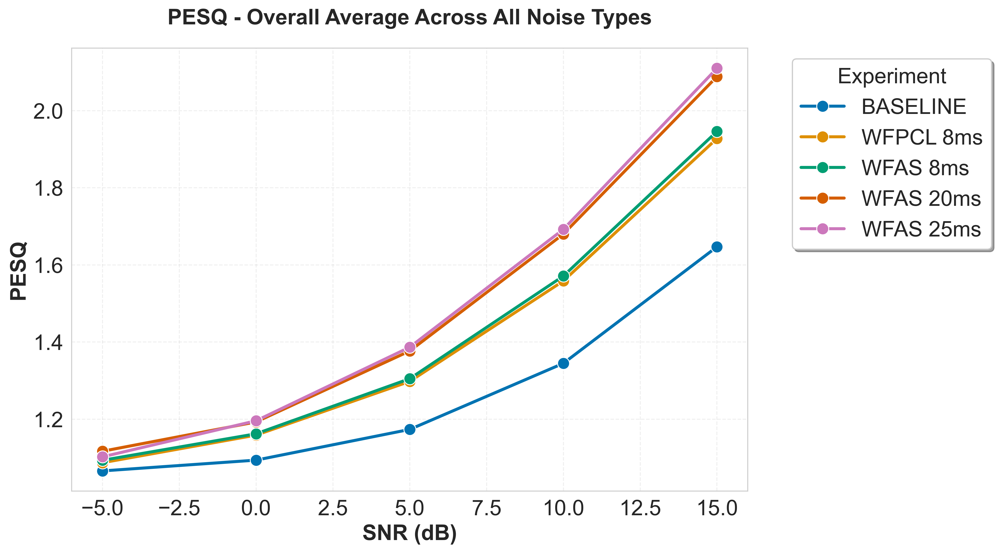

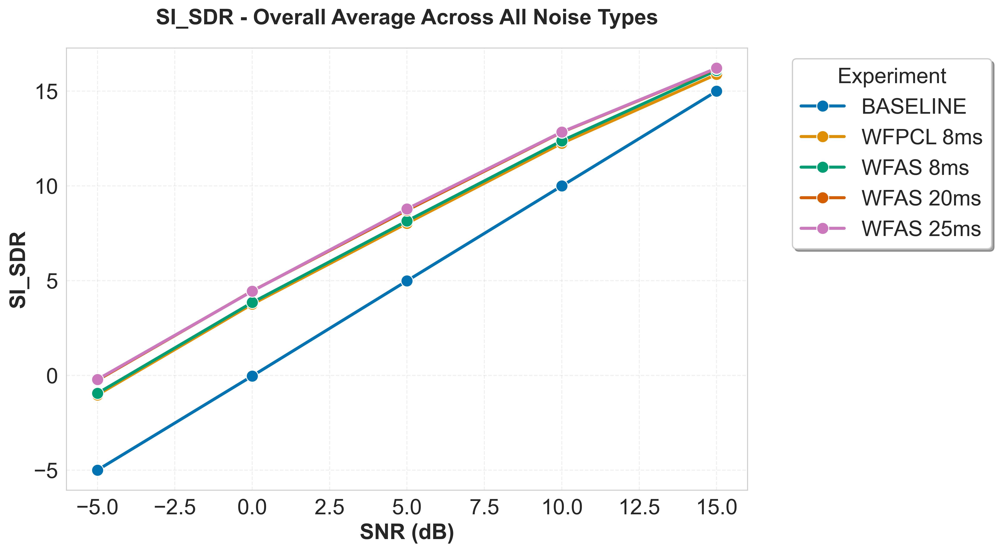

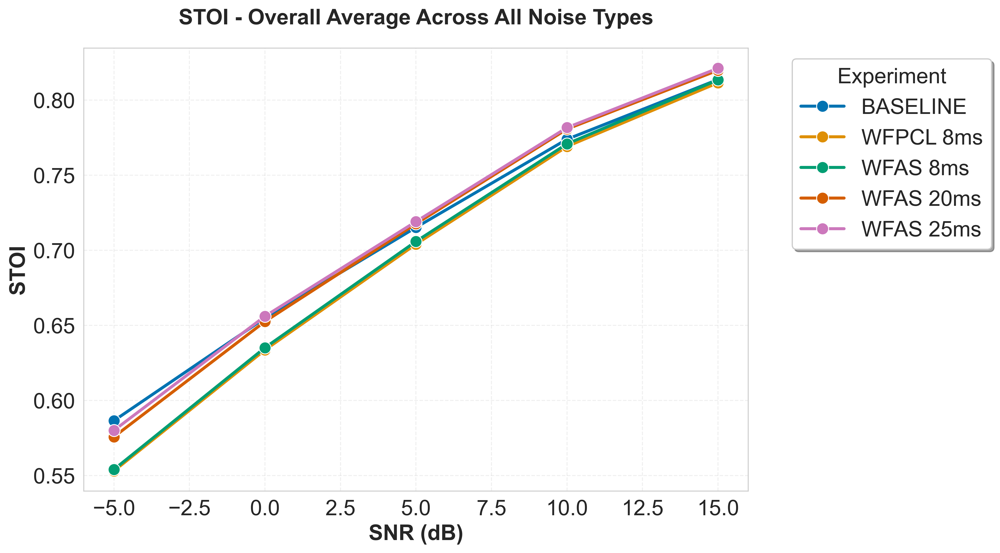

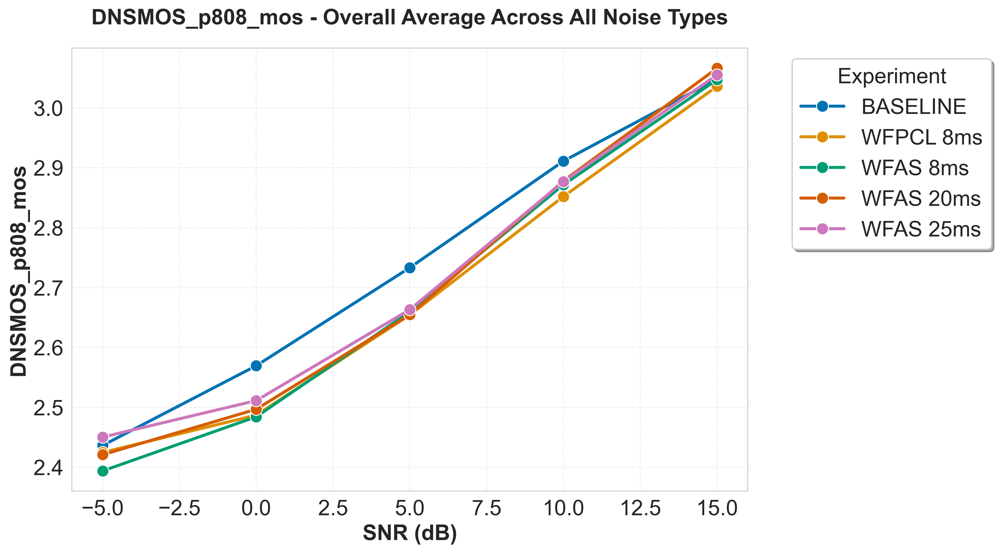

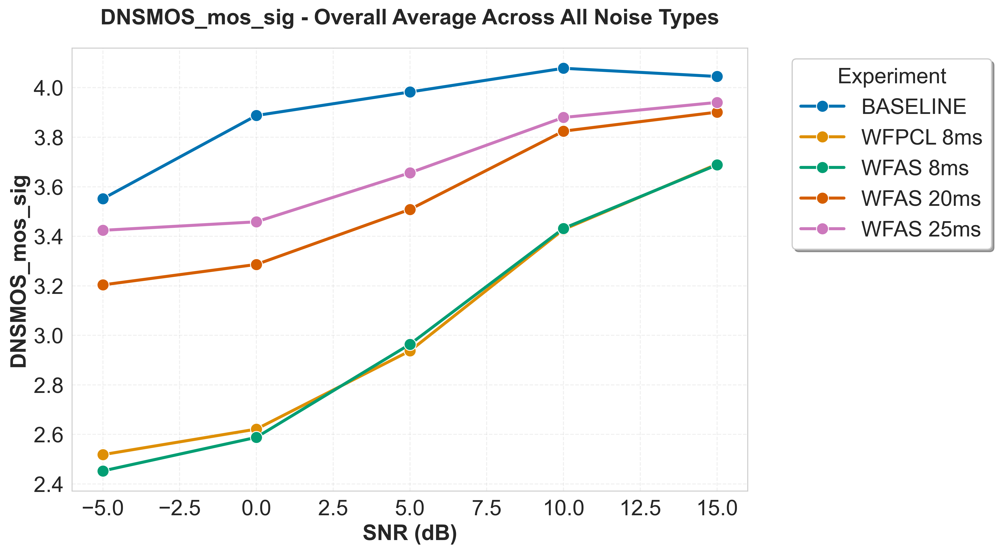

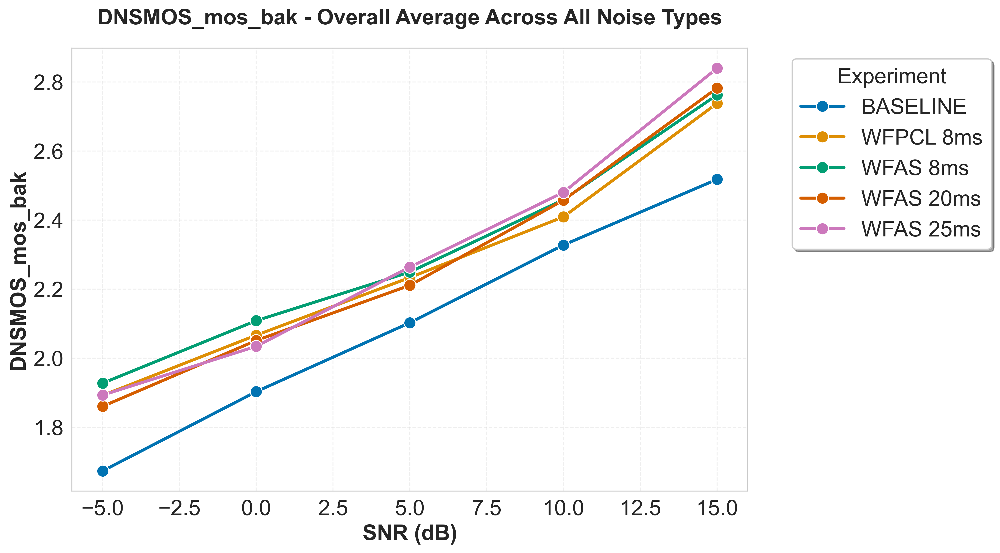

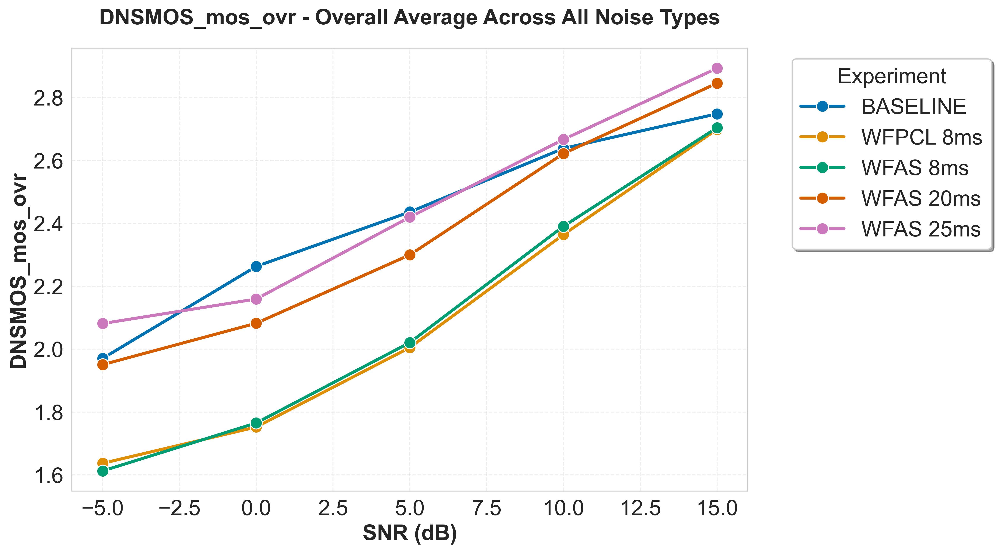

✓ Plotted 7 overall metric trends


In [146]:
# Define experiment order for consistent plotting
EXP_ORDER = list(EXPERIMENT_DIRS.keys())

# Plot overall metric trends
print("Generating overall performance plots...")
plot_overall_metric_trends(overall_df, METRICS, EXP_ORDER)

In [147]:
# Display summary table of overall metrics
print("\n" + "="*100)
print("SUMMARY TABLE: Overall Mean Metrics Across All Noise Types")
print("="*100)

summary_table = overall_df.pivot(index='exp', columns='snr', values=METRICS[0])
for metric in METRICS:
    print(f"\n{metric}:")
    metric_table = overall_df.pivot(index='exp', columns='snr', values=metric)
    metric_table = metric_table.reindex(EXP_ORDER)
    print(metric_table.round(3).to_string())
    print("-" * 80)


SUMMARY TABLE: Overall Mean Metrics Across All Noise Types

PESQ:
snr          -5      0      5      10     15
exp                                         
BASELINE   1.066  1.094  1.173  1.345  1.647
WFPCL 8ms  1.087  1.159  1.298  1.558  1.928
WFAS 8ms   1.093  1.162  1.305  1.571  1.946
WFAS 20ms  1.117  1.193  1.377  1.680  2.088
WFAS 25ms  1.102  1.196  1.387  1.692  2.110
--------------------------------------------------------------------------------

SI_SDR:
snr          -5      0      5       10      15
exp                                           
BASELINE  -4.990 -0.026  4.996   9.999  14.999
WFPCL 8ms -1.025  3.762  8.031  12.250  15.886
WFAS 8ms  -0.941  3.852  8.152  12.383  16.097
WFAS 20ms -0.249  4.458  8.718  12.835  16.196
WFAS 25ms -0.209  4.449  8.786  12.848  16.214
--------------------------------------------------------------------------------

STOI:
snr          -5      0      5      10     15
exp                                         
BASELINE   0.587  0.6

## 5. Noise Type Breakdown Analysis

Generating noise type breakdown plots...
Note: This will generate 35 plots

Generating demonstration plots for metrics ['PESQ', 'STOI', 'SI_SDR'] at SNRs [0, 10]...


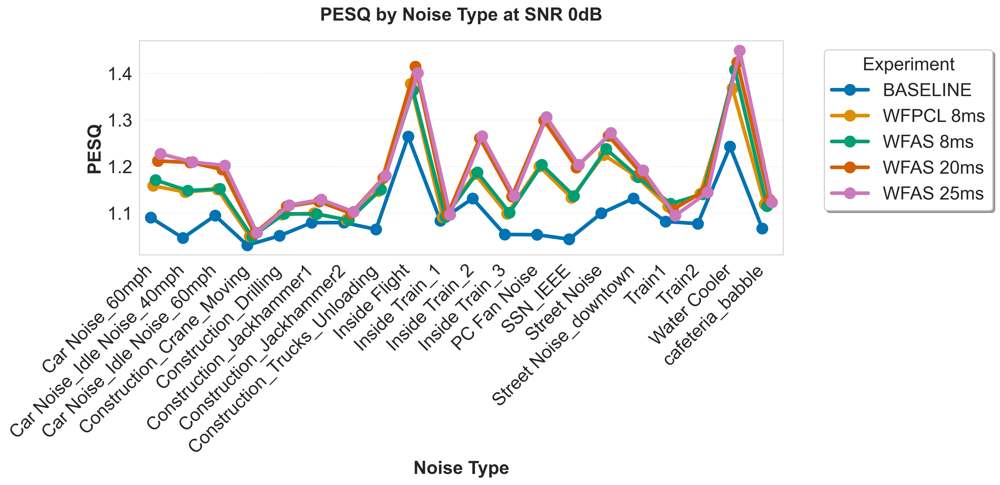

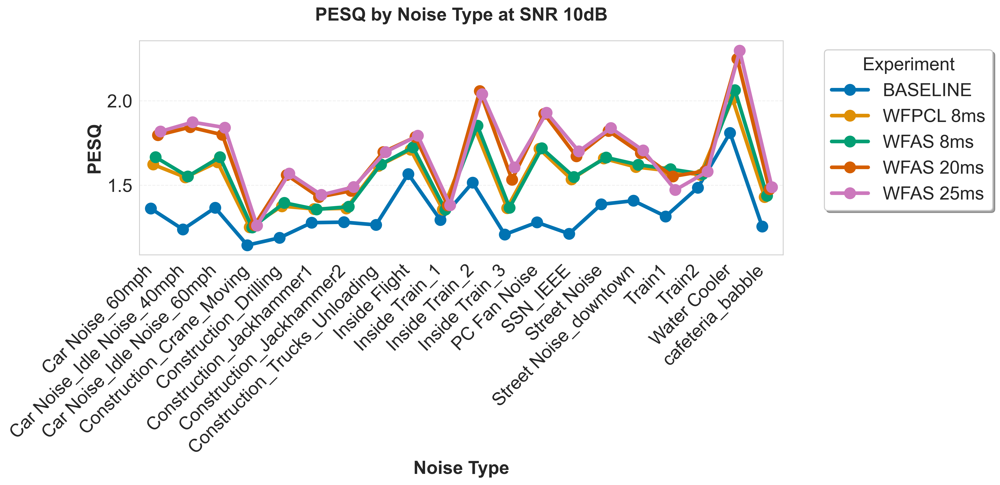

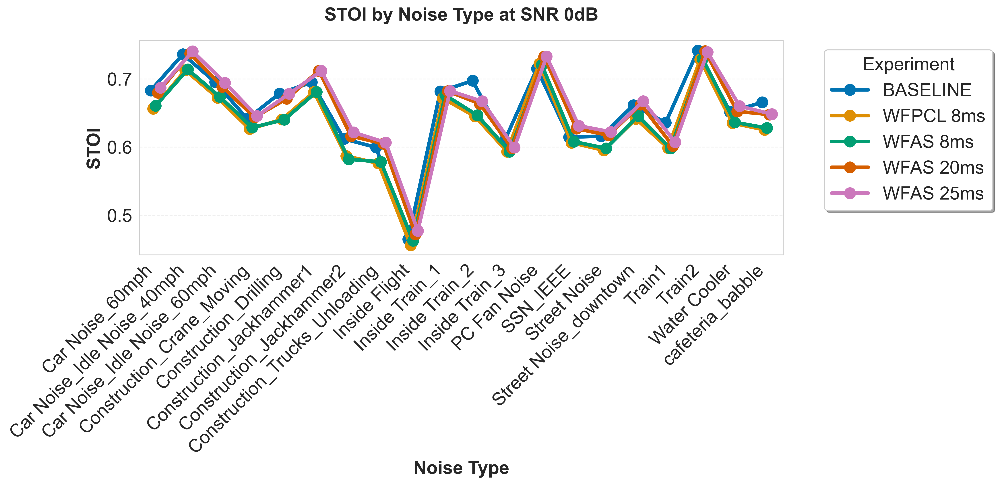

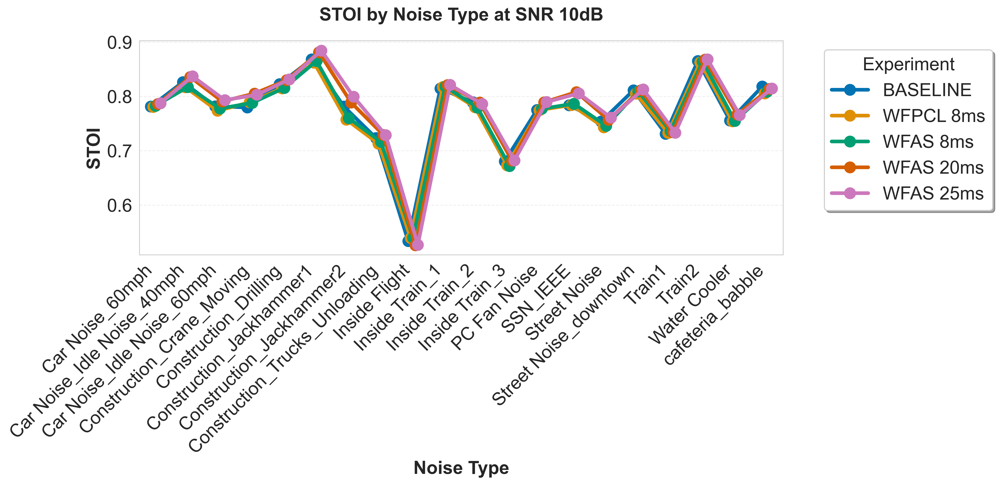

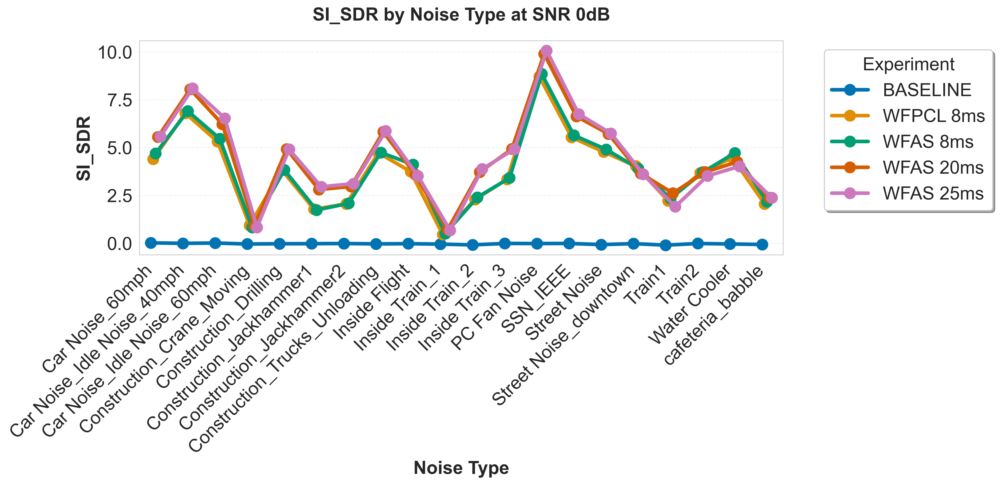

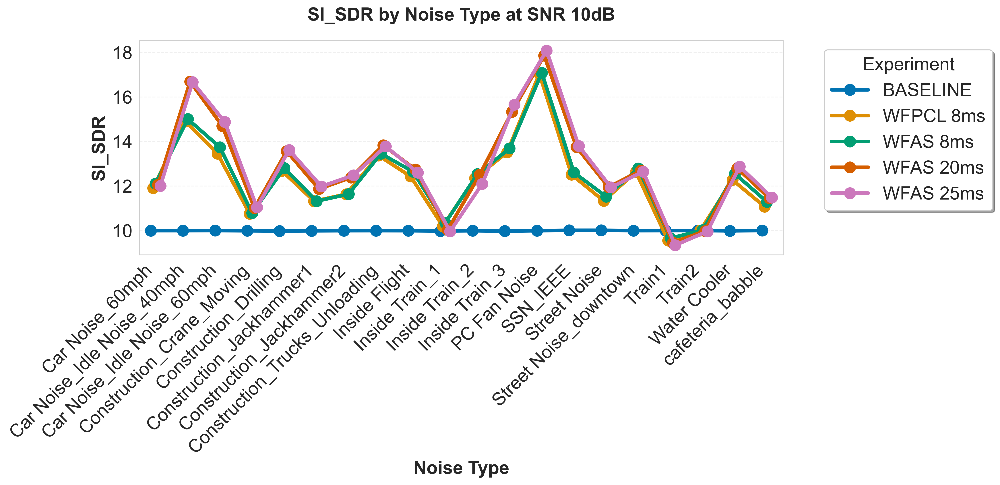

✓ Plotted 3 × 2 noise type breakdowns


In [148]:
# Plot performance breakdown by noise type
print("Generating noise type breakdown plots...")
print("Note: This will generate", len(METRICS) * len(SNR_LEVELS), "plots")

# Uncomment to generate all plots (may take time)
# plot_noise_type_breakdown(combined_df, METRICS, SNR_LEVELS, EXP_ORDER)

# Generate plots for select metrics and SNRs for demonstration
demo_metrics = ['PESQ', 'STOI', 'SI_SDR']
demo_snrs = [0, 10]
print(f"\nGenerating demonstration plots for metrics {demo_metrics} at SNRs {demo_snrs}...")
plot_noise_type_breakdown(combined_df, demo_metrics, demo_snrs, EXP_ORDER)

## 6. Improvement Analysis (Relative to Baseline)

In [149]:
def calculate_improvements(data: pd.DataFrame, metrics: List[str], 
                          baseline_name: str = 'BASELINE') -> pd.DataFrame:
    """
    Calculate percentage improvements relative to baseline.
    
    Args:
        data: DataFrame with experiment results
        metrics: List of metric names
        baseline_name: Name of baseline experiment
    
    Returns:
        pd.DataFrame: Data with improvement percentages added
    """
    improvement_data = data.copy()
    
    # Determine if data has noise_type column (per-noise-type data) or not (overall data)
    has_noise_type = 'noise_type' in data.columns
    
    if has_noise_type:
        # For per-noise-type data, group by noise_type and SNR
        grouping_cols = ['noise_type', 'snr']
    else:
        # For overall data, group by SNR only
        grouping_cols = ['snr']
    
    # Get baseline values
    baseline_df = data[data['exp'] == baseline_name].set_index(grouping_cols)[metrics]
    
    # Calculate improvements for each metric
    for metric in metrics:
        improvement_values = []
        
        for idx, row in improvement_data.iterrows():
            if row['exp'] == baseline_name:
                # No improvement for baseline itself
                improvement_values.append(np.nan)
            else:
                # Get the matching baseline value
                if has_noise_type:
                    key = (row['noise_type'], row['snr'])
                else:
                    key = (row['snr'],)
                
                try:
                    baseline_value = baseline_df.loc[key, metric]
                    exp_value = row[metric]
                    improvement = ((exp_value - baseline_value) / baseline_value * 100)
                    improvement_values.append(improvement)
                except KeyError:
                    # If baseline not found, append NaN
                    improvement_values.append(np.nan)
        
        improvement_data[f'{metric}_improvement'] = improvement_values
    
    return improvement_data

In [150]:
# Calculate overall improvements (averaged across all noise types)
print("="*100)
print("OVERALL IMPROVEMENTS ACROSS ALL NOISE TYPES")
print("="*100)

overall_improvements = calculate_improvements(overall_df, METRICS)

# Display improvement tables for each metric
for metric in METRICS:
    improvement_col = f'{metric}_improvement'
    if improvement_col in overall_improvements.columns:
        table_df = overall_improvements[overall_improvements['exp'] != 'BASELINE'].pivot(
            index='exp', columns='snr', values=improvement_col
        ).reindex([exp for exp in EXP_ORDER if exp != 'BASELINE'])
        
        print(f"\n{metric} - Percentage Improvement Relative to BASELINE (%):")
        print(table_df.round(2).to_string())
        print("-" * 80)

OVERALL IMPROVEMENTS ACROSS ALL NOISE TYPES

PESQ - Percentage Improvement Relative to BASELINE (%):
snr         -5     0      5      10     15
exp                                       
WFPCL 8ms  1.99  5.93  10.61  15.88  17.05
WFAS 8ms   2.58  6.24  11.21  16.83  18.16
WFAS 20ms  4.79  9.06  17.34  24.93  26.80
WFAS 25ms  3.42  9.33  18.17  25.84  28.11
--------------------------------------------------------------------------------

SI_SDR - Percentage Improvement Relative to BASELINE (%):
snr          -5         0      5      10    15
exp                                           
WFPCL 8ms -79.46 -14427.36  60.75  22.51  5.92
WFAS 8ms  -81.15 -14771.00  63.19  23.84  7.32
WFAS 20ms -95.01 -17078.64  74.51  28.36  7.98
WFAS 25ms -95.81 -17041.16  75.88  28.49  8.10
--------------------------------------------------------------------------------

STOI - Percentage Improvement Relative to BASELINE (%):
snr         -5     0     5     10    15
exp                                    
W

In [151]:
# Calculate per-noise-type improvements
print("\n\n" + "="*100)
print("PER-NOISE-TYPE IMPROVEMENTS")
print("="*100)

noise_types = sorted(combined_df['noise_type'].unique())

# Calculate improvements for each noise type
per_noise_improvements = calculate_improvements(combined_df, METRICS)

# Display improvements for each noise type
for noise_type in noise_types:
    print(f"\n{'='*80}")
    print(f"NOISE TYPE: {noise_type}")
    print(f"{'='*80}")
    
    noise_data = per_noise_improvements[per_noise_improvements['noise_type'] == noise_type]
    
    for metric in METRICS:
        improvement_col = f'{metric}_improvement'
        if improvement_col in noise_data.columns:
            table_df = noise_data[noise_data['exp'] != 'BASELINE'].pivot(
                index='exp', columns='snr', values=improvement_col
            ).reindex([exp for exp in EXP_ORDER if exp != 'BASELINE'])
            
            print(f"\n{metric} - Percentage Improvement (%):")
            print(table_df.round(2).to_string())
            print("-" * 60)



PER-NOISE-TYPE IMPROVEMENTS

NOISE TYPE: Car Noise_60mph

PESQ - Percentage Improvement (%):
snr         -5      0      5      10     15
exp                                        
WFPCL 8ms  2.97   6.27  14.04  19.06  22.89
WFAS 8ms   3.36   7.40  15.38  22.24  25.42
WFAS 20ms  5.06  11.16  25.46  31.76  37.21
WFAS 25ms  5.81  12.58  27.43  33.37  40.69
------------------------------------------------------------

SI_SDR - Percentage Improvement (%):
snr           -5         0      5      10    15
exp                                            
WFPCL 8ms  -96.96  17097.13  72.25  19.11 -3.45
WFAS 8ms  -101.76  18266.09  75.83  21.16 -1.73
WFAS 20ms -125.96  21631.21  90.26  20.60 -8.73
WFAS 25ms -130.89  21713.25  91.87  20.11 -9.68
------------------------------------------------------------

STOI - Percentage Improvement (%):
snr         -5     0     5     10    15
exp                                    
WFPCL 8ms -5.82 -3.91 -2.37 -0.06  0.07
WFAS 8ms  -5.18 -3.30 -1.73  0.21  0.

## 7. Statistical Summary and Key Findings

In [152]:
# Calculate best performing experiment for each metric and SNR
print("="*100)
print("BEST PERFORMING EXPERIMENTS")
print("="*100)

for metric in METRICS:
    print(f"\n{metric}:")
    print("-" * 80)
    
    for snr in SNR_LEVELS:
        snr_data = overall_df[overall_df['snr'] == snr]
        best_idx = snr_data[metric].idxmax()
        best_exp = snr_data.loc[best_idx, 'exp']
        best_value = snr_data.loc[best_idx, metric]
        
        # Get baseline value for comparison
        baseline_value = snr_data[snr_data['exp'] == 'BASELINE'][metric].values[0]
        improvement = ((best_value - baseline_value) / baseline_value * 100)
        
        print(f"  SNR {snr:3d}dB: {best_exp:15s} = {best_value:.3f} "
              f"(+{improvement:6.2f}% vs BASELINE: {baseline_value:.3f})")

BEST PERFORMING EXPERIMENTS

PESQ:
--------------------------------------------------------------------------------
  SNR  -5dB: WFAS 20ms       = 1.117 (+  4.79% vs BASELINE: 1.066)
  SNR   0dB: WFAS 25ms       = 1.196 (+  9.33% vs BASELINE: 1.094)
  SNR   5dB: WFAS 25ms       = 1.387 (+ 18.17% vs BASELINE: 1.173)
  SNR  10dB: WFAS 25ms       = 1.692 (+ 25.84% vs BASELINE: 1.345)
  SNR  15dB: WFAS 25ms       = 2.110 (+ 28.11% vs BASELINE: 1.647)

SI_SDR:
--------------------------------------------------------------------------------
  SNR  -5dB: WFAS 25ms       = -0.209 (+-95.81% vs BASELINE: -4.990)
  SNR   0dB: WFAS 20ms       = 4.458 (+-17078.64% vs BASELINE: -0.026)
  SNR   5dB: WFAS 25ms       = 8.786 (+ 75.88% vs BASELINE: 4.996)
  SNR  10dB: WFAS 25ms       = 12.848 (+ 28.49% vs BASELINE: 9.999)
  SNR  15dB: WFAS 25ms       = 16.214 (+  8.10% vs BASELINE: 14.999)

STOI:
--------------------------------------------------------------------------------
  SNR  -5dB: BASELINE      

In [153]:
# Average improvement across all SNRs for each experiment
print("\n" + "="*100)
print("AVERAGE IMPROVEMENT ACROSS ALL SNR LEVELS")
print("="*100)

for metric in METRICS:
    improvement_col = f'{metric}_improvement'
    if improvement_col in overall_improvements.columns:
        avg_improvements = overall_improvements[
            overall_improvements['exp'] != 'BASELINE'
        ].groupby('exp')[improvement_col].mean()
        
        avg_improvements = avg_improvements.reindex(
            [exp for exp in EXP_ORDER if exp != 'BASELINE']
        )
        
        print(f"\n{metric}:")
        for exp, improvement in avg_improvements.items():
            print(f"  {exp:15s}: {improvement:+7.2f}%")
        print("-" * 80)


AVERAGE IMPROVEMENT ACROSS ALL SNR LEVELS

PESQ:
  WFPCL 8ms      :  +10.29%
  WFAS 8ms       :  +11.01%
  WFAS 20ms      :  +16.58%
  WFAS 25ms      :  +16.97%
--------------------------------------------------------------------------------

SI_SDR:
  WFPCL 8ms      : -2883.53%
  WFAS 8ms       : -2951.56%
  WFAS 20ms      : -3412.56%
  WFAS 25ms      : -3404.90%
--------------------------------------------------------------------------------

STOI:
  WFPCL 8ms      :   -2.28%
  WFAS 8ms       :   -2.06%
  WFAS 20ms      :   -0.04%
  WFAS 25ms      :   +0.31%
--------------------------------------------------------------------------------

DNSMOS_p808_mos:
  WFPCL 8ms      :   -1.80%
  WFAS 8ms       :   -1.83%
  WFAS 20ms      :   -1.38%
  WFAS 25ms      :   -1.04%
--------------------------------------------------------------------------------

DNSMOS_mos_sig:
  WFPCL 8ms      :  -22.53%
  WFAS 8ms       :  -22.93%
  WFAS 20ms      :   -9.39%
  WFAS 25ms      :   -6.06%
-----------

In [154]:
# Variance analysis - which experiments are most consistent across noise types
print("\n" + "="*100)
print("CONSISTENCY ANALYSIS (Standard Deviation Across Noise Types)")
print("="*100)
print("Lower values indicate more consistent performance across different noise types")

for metric in METRICS:
    print(f"\n{metric}:")
    print("-" * 80)
    
    for snr in SNR_LEVELS:
        snr_data = combined_df[combined_df['snr'] == snr]
        std_by_exp = snr_data.groupby('exp')[metric].std()
        std_by_exp = std_by_exp.reindex(EXP_ORDER)
        
        print(f"\n  SNR {snr}dB:")
        for exp, std_val in std_by_exp.items():
            print(f"    {exp:15s}: {std_val:.4f}")


CONSISTENCY ANALYSIS (Standard Deviation Across Noise Types)
Lower values indicate more consistent performance across different noise types

PESQ:
--------------------------------------------------------------------------------

  SNR -5dB:
    BASELINE       : 0.0358
    WFPCL 8ms      : 0.0378
    WFAS 8ms       : 0.0486
    WFAS 20ms      : 0.0859
    WFAS 25ms      : 0.0418

  SNR 0dB:
    BASELINE       : 0.0608
    WFPCL 8ms      : 0.0847
    WFAS 8ms       : 0.0890
    WFAS 20ms      : 0.0997
    WFAS 25ms      : 0.1027

  SNR 5dB:
    BASELINE       : 0.0955
    WFPCL 8ms      : 0.1308
    WFAS 8ms       : 0.1395
    WFAS 20ms      : 0.1773
    WFAS 25ms      : 0.1862

  SNR 10dB:
    BASELINE       : 0.1558
    WFPCL 8ms      : 0.1857
    WFAS 8ms       : 0.1950
    WFAS 20ms      : 0.2385
    WFAS 25ms      : 0.2461

  SNR 15dB:
    BASELINE       : 0.2331
    WFPCL 8ms      : 0.2815
    WFAS 8ms       : 0.2948
    WFAS 20ms      : 0.3089
    WFAS 25ms      : 0.3119

SI_SDR:

## 8. Conclusions

### Key Findings:

1. **Validation of Python Implementation:**
   - Compare WFPCL 8ms (Python translation) with WFAS 8ms results to validate implementation

2. **Effect of Window Size:**
   - Analyze performance trends across 8ms, 20ms, and 25ms window sizes
   - Identify optimal window size for different SNR conditions

3. **Overall Performance:**
   - All Wiener filter variants show improvement over baseline
   - Performance varies by noise type and SNR level

### Recommendations:

Based on the analysis above, identify:
- Best performing configuration overall
- Most consistent algorithm across noise types
- Trade-offs between different window sizes

## 9. Export Results (Optional)

In [155]:
# Export results to CSV and figures (uncomment to use)

# Create output directory
output_dir = repo_root / "reports" / "WF_EXP1p1_ANALYSIS"
output_dir.mkdir(parents=True, exist_ok=True)

print(f"Output directory: {output_dir}")

# Export overall metrics
overall_df.to_csv(output_dir / "overall_metrics.csv", index=False)
print("✓ Exported overall_metrics.csv")

# Export combined data
combined_df.to_csv(output_dir / "combined_metrics.csv", index=False)
print("✓ Exported combined_metrics.csv")

# Export improvement data
overall_improvements.to_csv(output_dir / "overall_improvements.csv", index=False)
print("✓ Exported overall_improvements.csv")

# Uncomment to save all plots
# figures_dir = output_dir / "figures"
# figures_dir.mkdir(exist_ok=True)
# plot_overall_metric_trends(overall_df, METRICS, EXP_ORDER, save_dir=figures_dir)
# plot_noise_type_breakdown(combined_df, METRICS, SNR_LEVELS, EXP_ORDER, save_dir=figures_dir)
# print(f"✓ Exported all figures to {figures_dir}")

print("\n✓ Export complete!")

Output directory: c:\Users\kapun_63wn2un\Documents\ELEN4012 - Investigation\Repository\PROJECT-25P85\reports\WF_EXP1p1_ANALYSIS
✓ Exported overall_metrics.csv
✓ Exported combined_metrics.csv
✓ Exported overall_improvements.csv

✓ Export complete!
✓ Exported overall_metrics.csv
✓ Exported combined_metrics.csv
✓ Exported overall_improvements.csv

✓ Export complete!
